In [25]:
%load_ext autoreload
%autoreload 2
import warnings
import numpy as np
import time
import os
from dotenv import load_dotenv
os.environ["USE_PYGEOS"] = "0"
import napari_sparrow as nas
from spatialdata import read_zarr
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from random import sample 
import scanpy as sc
import seaborn as sns
import anndata as ad
%run own_and_modified_functions.ipynb
warnings.simplefilter(action='ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
OUTPUT_DIR = '/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/A1-1'
# sdata = read_zarr( os.path.join(  OUTPUT_DIR, 'sdata.zarr'  ) )
# anndata = sdata.table
name_anndata = "anndataNucA11"
anndata = sc.read(OUTPUT_DIR + '/' + name_anndata) 

In [7]:
n_pca = np.count_nonzero(anndata.uns['pca']['variance_ratio'] > 0.01)
make_umap(anndata,n_PCAs=n_pca,n_neighbors=15) # umap only used for the visualization, does not have an effect on the annotation with 'score_genes'

In [8]:
path_mg_Martin = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_endoSplit_portalLAM.csv"

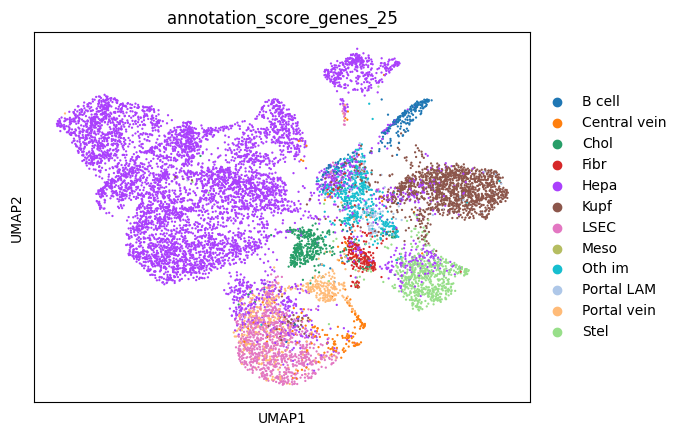

              annotation_score_genes_25
B cell                         2.331168
Central vein                   1.646054
Chol                           3.203132
Fibr                           1.993060
Hepa                          55.734496
Kupf                          12.225287
LSEC                           8.248065
Meso                           0.008898
Oth im                         3.977222
Portal LAM                     1.058813
Portal vein                    4.181867
Stel                           5.391939


In [5]:
# Original score_genes (sdata necessary, still have to make anndata compatible)
mg_dict, scoresper_cluster = score_genes_bins(
    sdata = sdata,
    path_marker_genes = path_mg,
    bins = 25)
visualize_classification(sdata,'annotation_score_genes_25','umap_15',path_mg,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

Hepa            55.272533
LSEC            11.970075
Portal LAM       9.137870
Stel             7.018169
Kupf             5.717848
Oth im           1.861418
Portal vein      1.816886
B cell           1.772355
Fibr             1.585322
Unknown          1.380477
Chol             1.344852
Meso             0.819380
Central vein     0.302814
Name: annotation_own_score_genes, dtype: float64


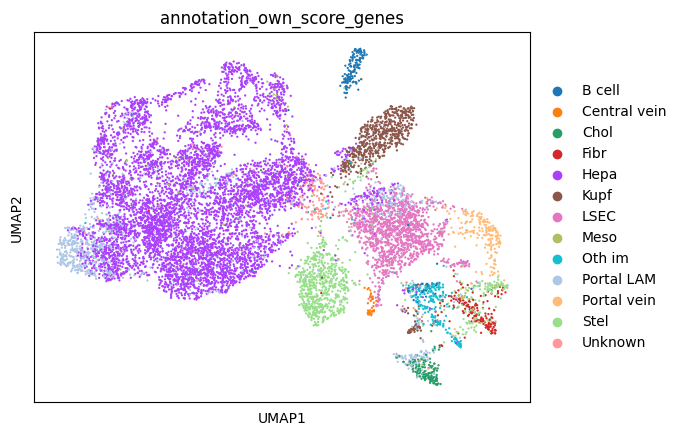

11.444602778767367


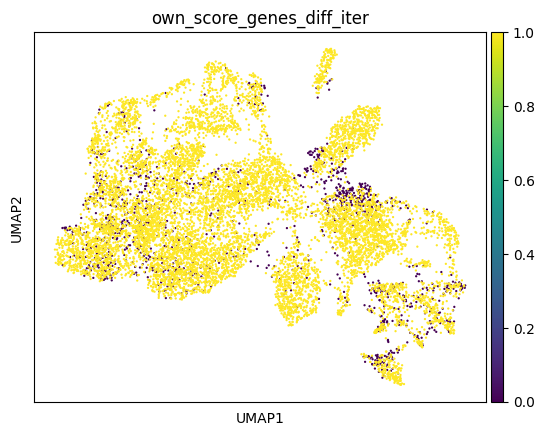

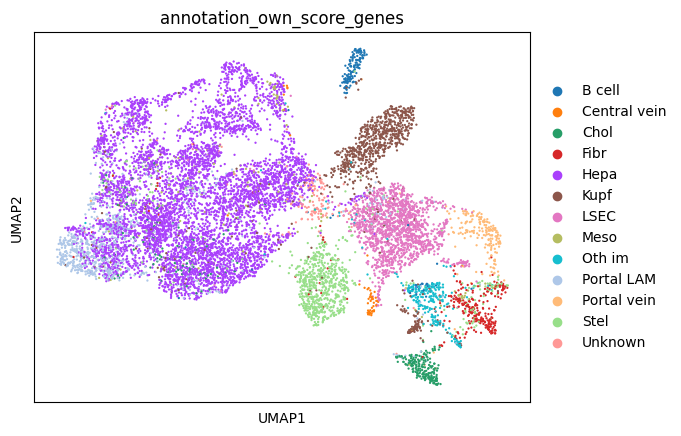

Hepa            50.792661
LSEC            13.056644
Kupf             7.980050
Portal LAM       7.062700
Stel             6.929106
Chol             2.814393
Fibr             2.565016
Oth im           2.395796
Portal vein      1.745636
B cell           1.585322
Unknown          1.380477
Meso             1.237976
Central vein     0.454222
Name: annotation_own_score_genes, dtype: float64
4.0790879942999645


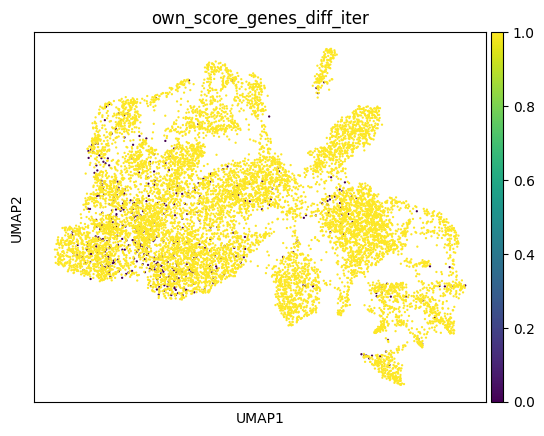

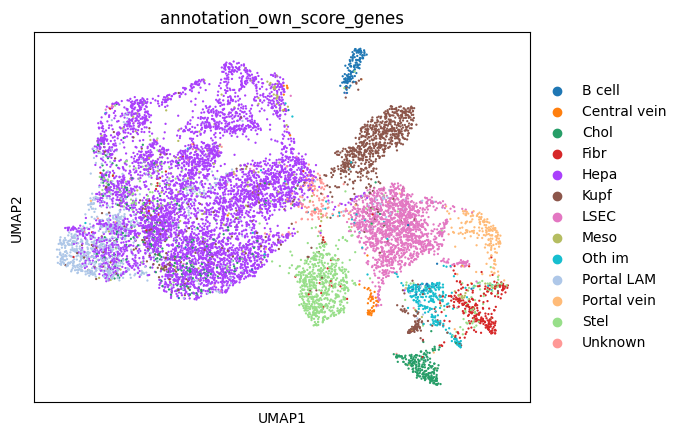

Hepa            47.826861
LSEC            13.136801
Kupf             8.852868
Portal LAM       7.258639
Stel             7.044888
Chol             4.292839
Fibr             2.743142
Oth im           2.547203
Portal vein      1.710011
B cell           1.496259
Unknown          1.380477
Meso             1.255789
Central vein     0.454222
Name: annotation_own_score_genes, dtype: float64
2.484859280370502


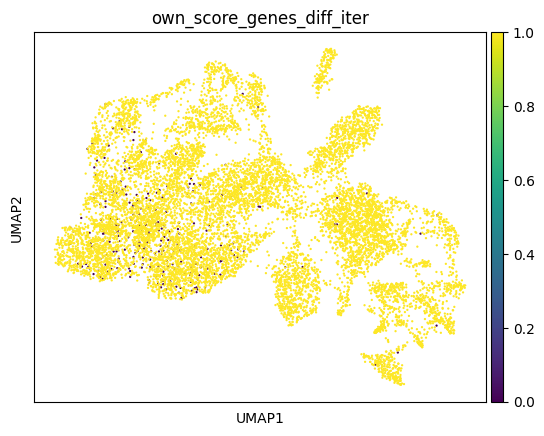

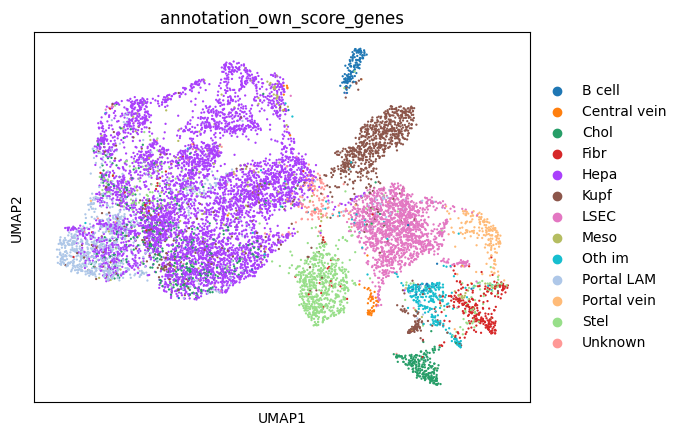

Hepa            45.502316
LSEC            13.136801
Kupf             9.084432
Portal LAM       7.837549
Stel             7.133951
Chol             5.682223
Fibr             2.787674
Oth im           2.591735
Portal vein      1.674385
B cell           1.496259
Unknown          1.380477
Meso             1.237976
Central vein     0.454222
Name: annotation_own_score_genes, dtype: float64
1.4250089063056643


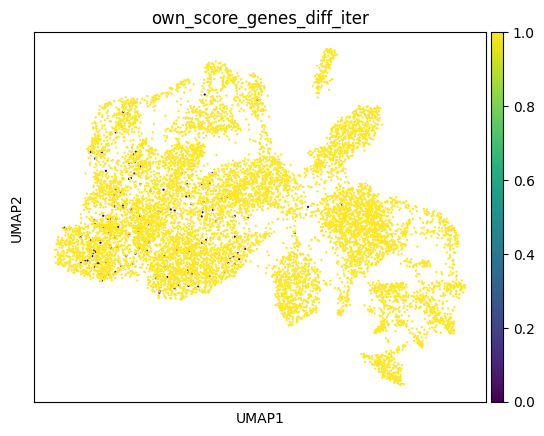

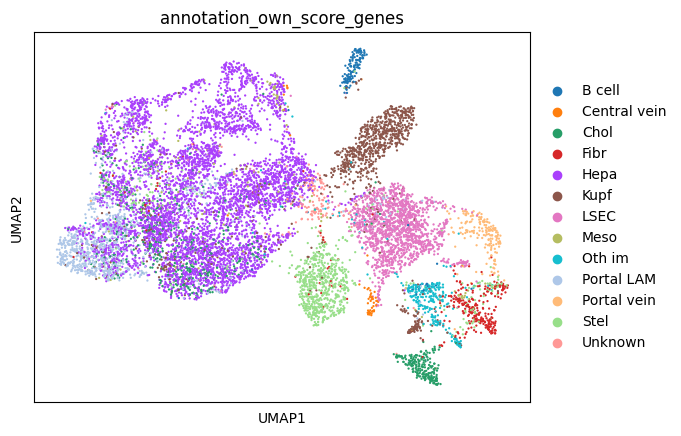

Hepa            44.166370
LSEC            13.136801
Kupf             9.128963
Portal LAM       8.505522
Stel             7.151763
Chol             6.296758
Fibr             2.796580
Oth im           2.600641
Portal vein      1.665479
B cell           1.496259
Unknown          1.380477
Meso             1.220164
Central vein     0.454222
Name: annotation_own_score_genes, dtype: float64
0.4720342002137513


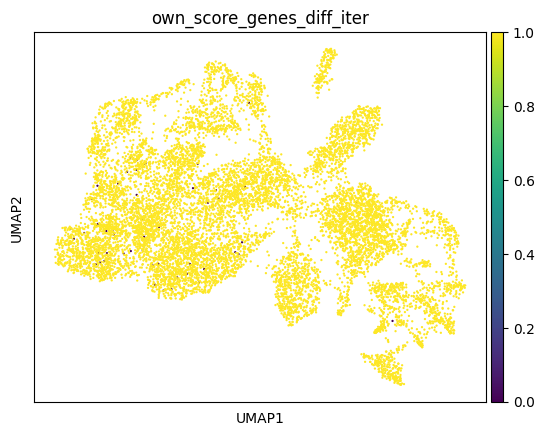

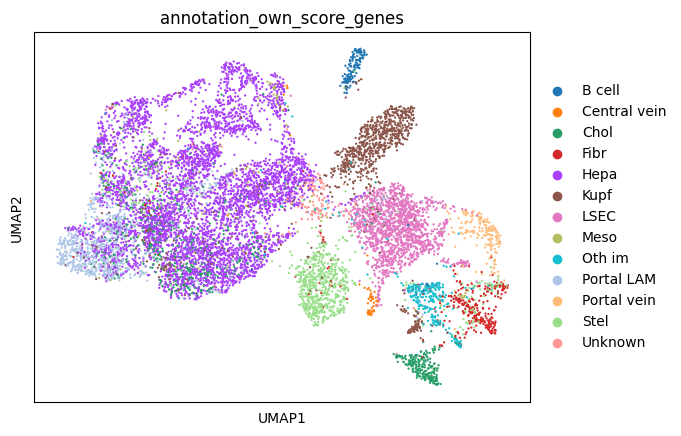

Hepa            43.729961
LSEC            13.145707
Kupf             9.128963
Portal LAM       8.710367
Stel             7.142857
Chol             6.537228
Fibr             2.796580
Oth im           2.609548
Portal vein      1.656573
B cell           1.496259
Unknown          1.380477
Meso             1.211258
Central vein     0.454222
Name: annotation_own_score_genes, dtype: float64
0.14250089063056642


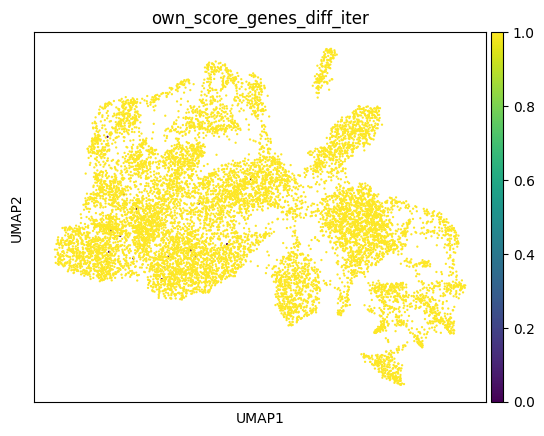

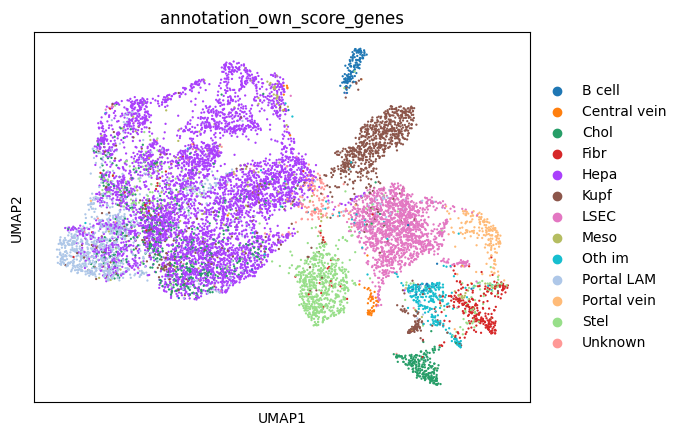

Hepa            43.614179
LSEC            13.145707
Kupf             9.128963
Portal LAM       8.719273
Stel             7.133951
Chol             6.653010
Fibr             2.796580
Oth im           2.609548
Portal vein      1.656573
B cell           1.496259
Unknown          1.380477
Meso             1.211258
Central vein     0.454222
Name: annotation_own_score_genes, dtype: float64
0.04453152832205201
converged


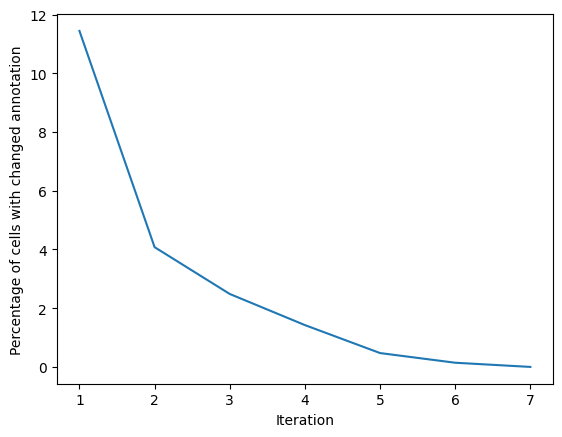

In [9]:
# Own score genes iterative
scores = own_score_genes_iterative(anndata,path_mg,nr_iterations=8,output_dir=OUTPUT_DIR)

Hepa            10.0
LSEC            20.0
Portal vein     14.0
Central vein    16.0
Chol            14.0
Kupf            25.0
Stel            24.0
Fibr            24.0
B cell          13.0
Meso            14.0
Portal LAM      15.0
Oth im           4.0
dtype: float64


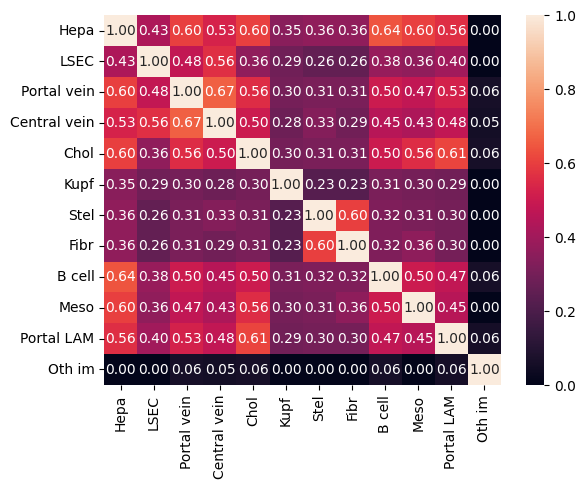

In [10]:
Jaccard_similarity_matrix(path_mg)

<AxesSubplot: >

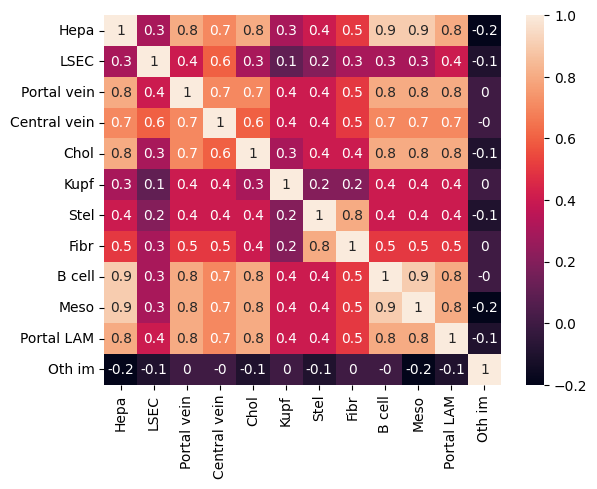

In [11]:
# plot correlation matrix of the features
sns.heatmap(np.round(scores.corr(method='pearson'),1), annot=True)
# sns.heatmap(scores_minmax.corr(method='pearson'), annot=True) gives the same heatmap

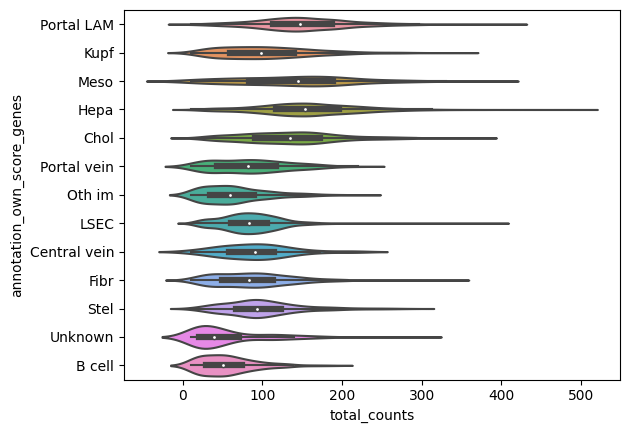

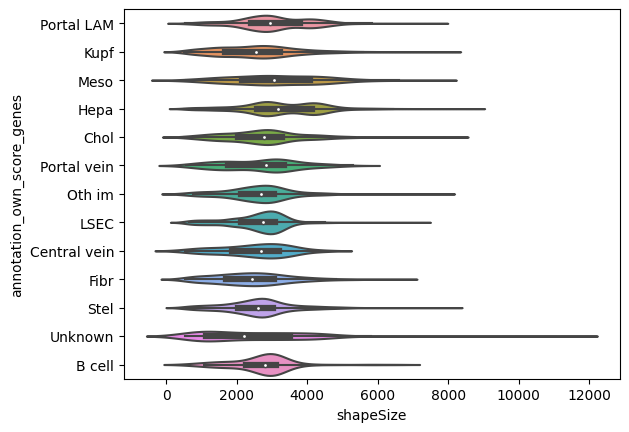

<AxesSubplot: xlabel='count_density', ylabel='annotation_own_score_genes'>

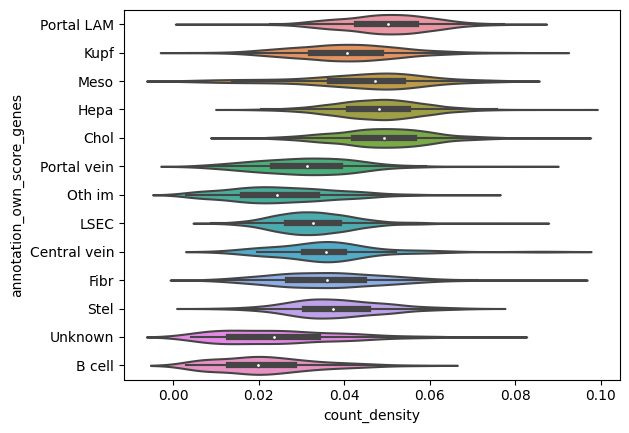

In [12]:
sns.violinplot(data=anndata.obs,x="total_counts",y="annotation_own_score_genes")
plt.show()
sns.violinplot(data=anndata.obs,x="shapeSize",y="annotation_own_score_genes")
plt.show()
anndata.obs['count_density'] = anndata.obs['total_counts'] / anndata.obs['shapeSize']
sns.violinplot(data=anndata.obs,x="count_density",y="annotation_own_score_genes")

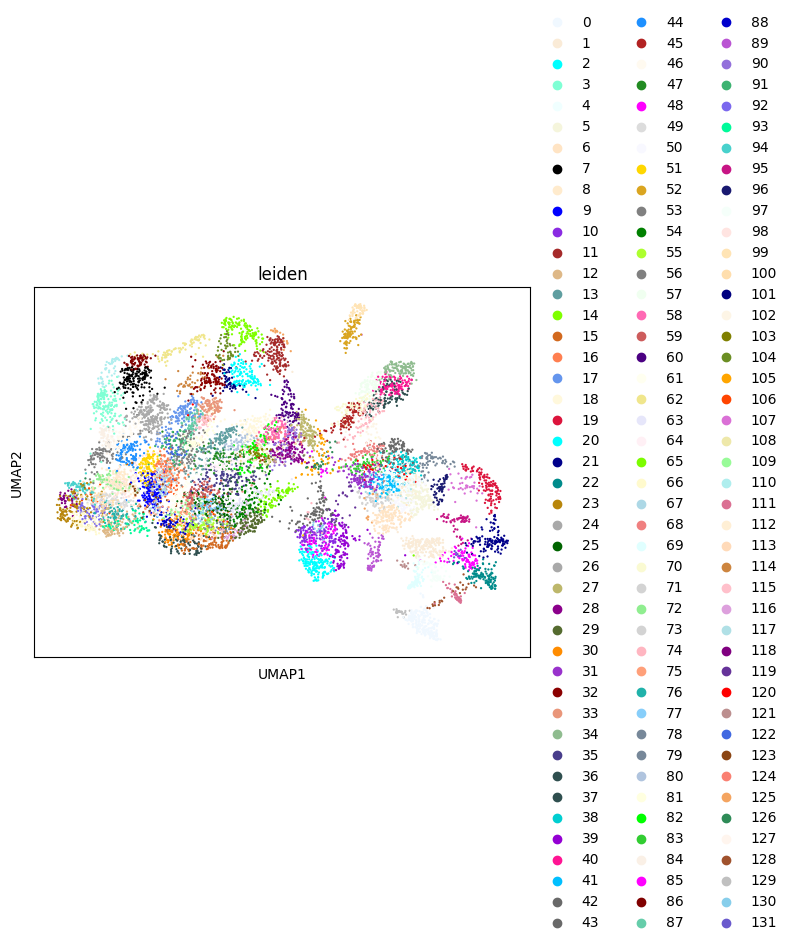

In [13]:
sc.tl.leiden(anndata,resolution=10,key_added='leiden')
sc.pl.umap(anndata,color='leiden',palette=list(matplotlib.colors.CSS4_COLORS.values()))

Hepa
[(3, 0.68, 157), (7, 0.78, 148), (9, 0.69, 144), (11, 0.8, 144), (13, 0.65, 130), (14, 0.98, 129), (15, 0.65, 128), (16, 0.79, 125), (17, 0.78, 120), (18, 0.82, 119), (20, 0.97, 118), (24, 0.72, 115), (25, 0.91, 115), (26, 0.76, 115), (27, 0.69, 114), (28, 0.82, 114), (29, 0.9, 113), (30, 0.72, 113), (32, 0.98, 112), (33, 0.92, 110), (35, 0.83, 109), (36, 0.66, 105), (46, 0.8, 99), (47, 0.92, 99), (51, 0.55, 94), (53, 0.88, 93), (54, 0.59, 93), (58, 0.96, 89), (59, 0.91, 88), (60, 0.95, 87), (61, 0.71, 86), (62, 0.94, 86), (63, 0.86, 86), (64, 0.84, 85), (65, 0.87, 85), (67, 0.79, 84), (72, 0.63, 78), (73, 0.78, 77), (75, 0.62, 76), (77, 0.88, 75), (79, 0.68, 72), (80, 0.97, 72), (81, 0.57, 72), (82, 0.77, 70), (86, 0.97, 68), (87, 0.94, 67), (90, 0.97, 66), (91, 0.77, 66), (94, 0.7, 63), (101, 0.98, 54), (103, 0.88, 52), (104, 0.98, 51), (108, 0.94, 48), (109, 0.87, 47), (110, 0.76, 45), (113, 0.95, 42), (114, 0.95, 41), (115, 0.95, 40), (116, 0.95, 39), (122, 0.83, 35), (124, 0.

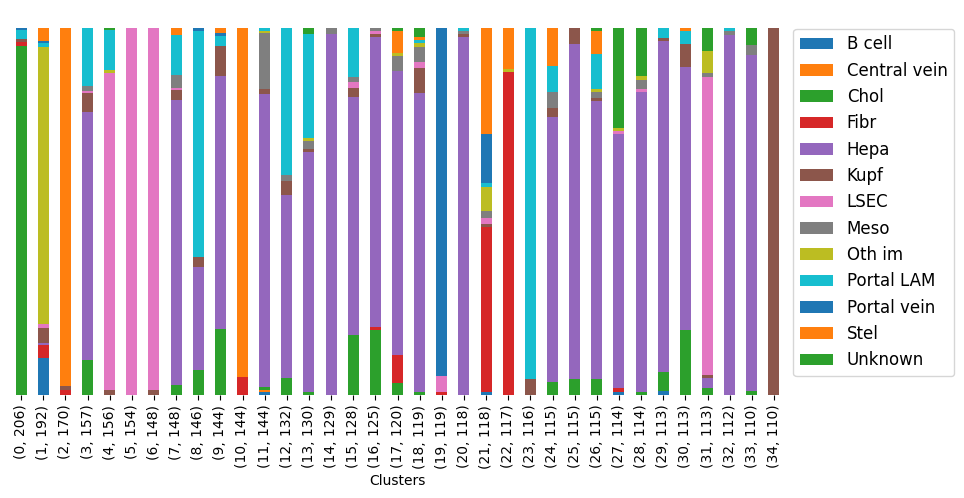

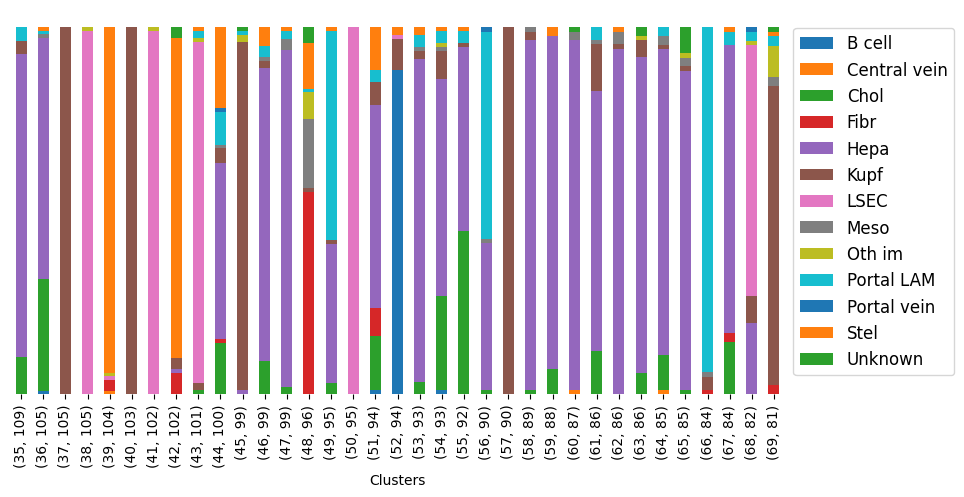

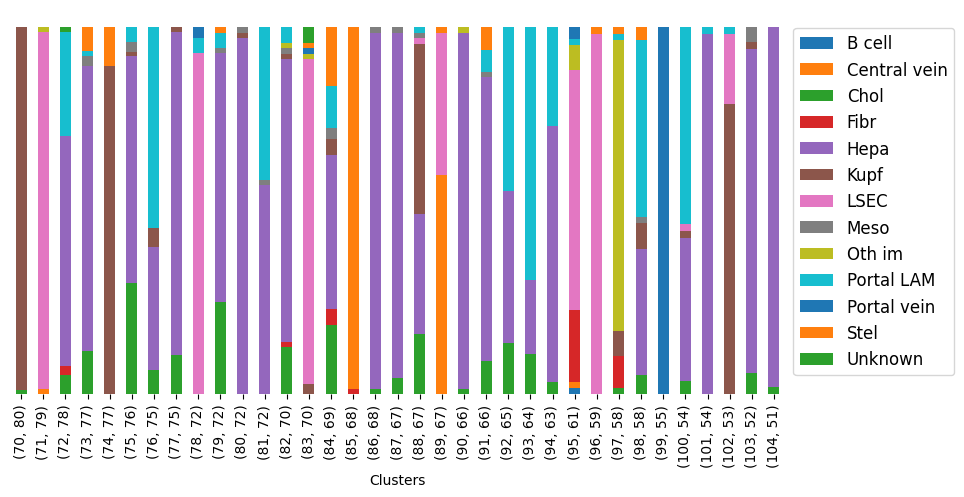

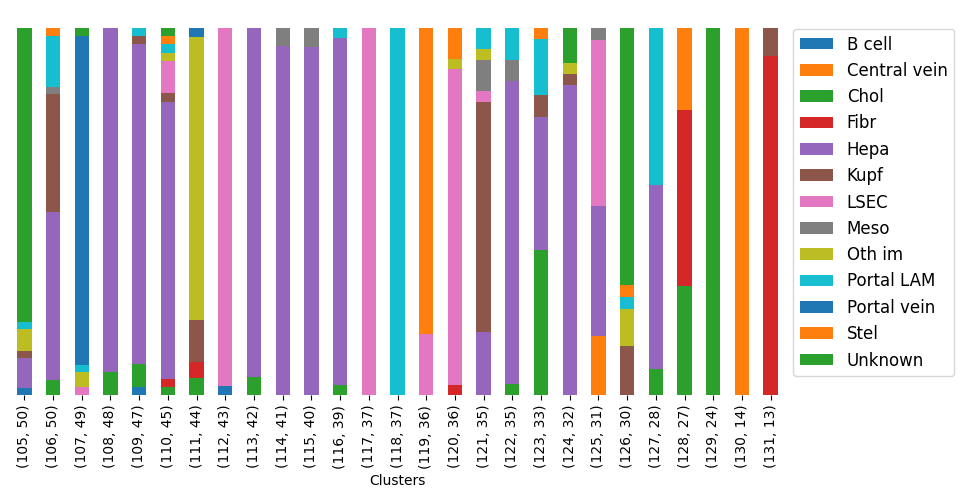

In [14]:
cell_types = ['Hepa','Kupf','LSEC','Central vein','Portal vein','Fibr','Stel','Meso','Chol','B cell','Oth im','Unknown','Portal LAM']
leiden_clusters_per_ct = clusteringVSleiden(anndata, "annotation_own_score_genes", "leiden",cell_types)

In [21]:
a = anndata.obs['leiden']
i = 0
for putative_leiden_clusters in leiden_clusters_per_ct:
    L = [str(x[0]) for x in putative_leiden_clusters]
    for n in L:
        a = a.replace(n,cell_types[i])
    i += 1
anndata.obs['leiden_cell_types'] = a
print(anndata.obs['leiden_cell_types'].value_counts())


Hepa            5399
LSEC            1513
Unknown          950
Kupf             833
Portal LAM       761
Stel             638
Oth im           294
Chol             230
Fibr             226
Portal vein      168
B cell           149
Central vein      67
Name: leiden_cell_types, dtype: int64


67
Summary:
Kupf
Maybe drop:[['Prox1', 'Hepa'], ['Pck1', 'Hepa'], ['Fn1', 'Hepa'], ['Ghr', 'Hepa'], ['Cyp2e1', 'Hepa'], ['Cyp2e1', 'Central vein'], ['Glul', 'Central vein'], ['Prox1', 'Chol'], ['Gls2', 'Portal LAM'], ['Ghr', 'Portal LAM'], ['Prox1', 'Portal LAM'], ['Hal', 'Portal LAM'], ['Fn1', 'Portal LAM'], ['Sds', 'Portal LAM'], ['Pck1', 'Portal LAM']]
LSEC
Maybe drop:[['Pck1', 'Hepa'], ['Prox1', 'Hepa'], ['Fn1', 'Hepa'], ['Ghr', 'Hepa'], ['Sirpa', 'Kupf'], ['Wnt2', 'Central vein'], ['Wnt9b', 'Central vein'], ['Lhx6', 'Central vein'], ['Glul', 'Central vein'], ['Adgrg6', 'Portal vein'], ['Prox1', 'Chol'], ['Ghr', 'Portal LAM'], ['Prox1', 'Portal LAM'], ['Hal', 'Portal LAM'], ['Fn1', 'Portal LAM'], ['Sds', 'Portal LAM'], ['Pck1', 'Portal LAM']]
Hepa
Maybe drop:[['Glul', 'Central vein'], ['Hal', 'Portal LAM'], ['Sds', 'Portal LAM']]
Central vein
Maybe drop:[['Pck1', 'Hepa'], ['Fn1', 'Hepa'], ['Prox1', 'Hepa'], ['Ghr', 'Hepa'], ['Hal', 'Hepa'], ['Gls2', 'Hepa'], ['Sds', 'Hepa'], ['Pck1

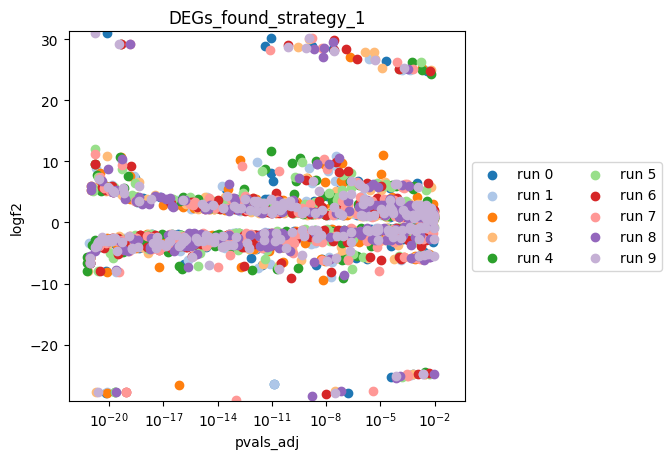

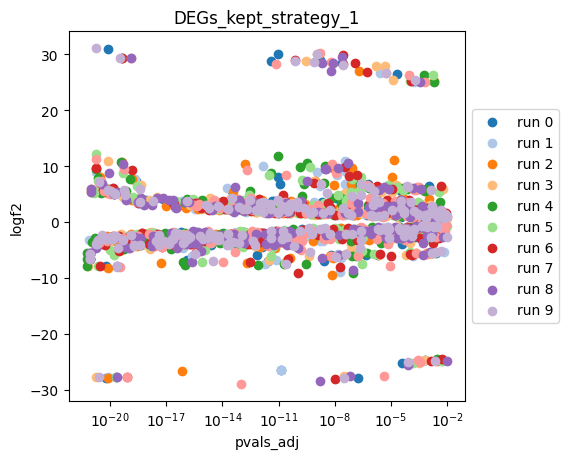

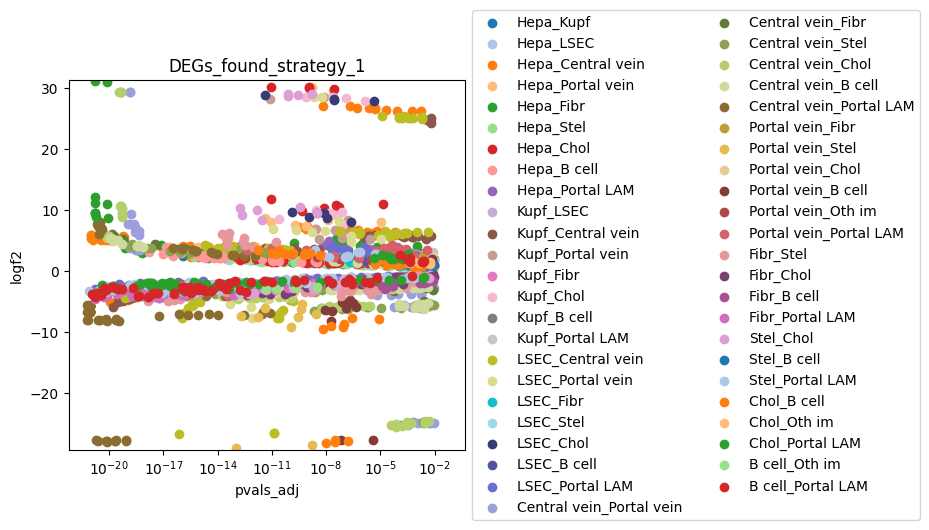

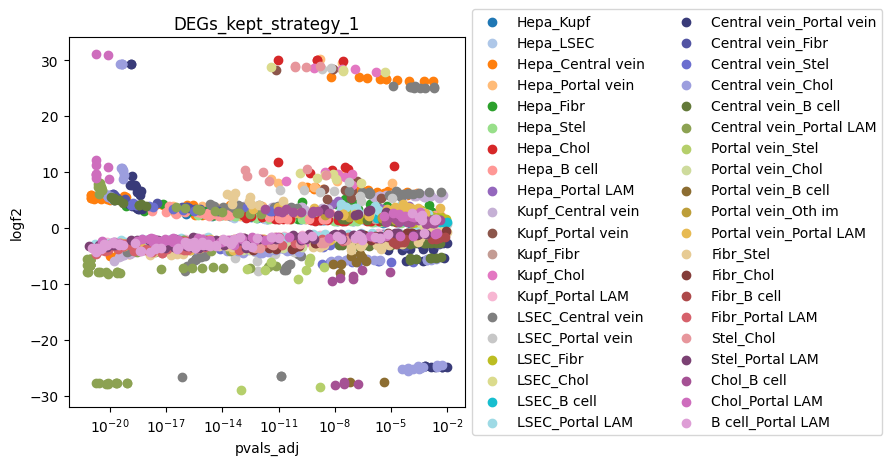

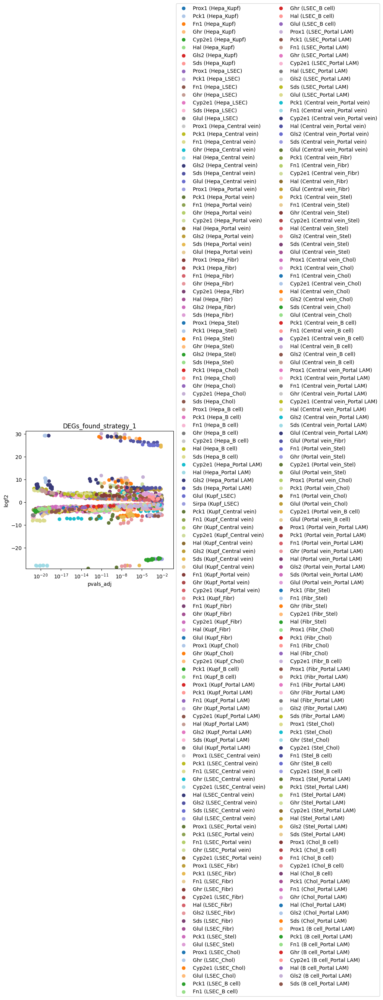

...

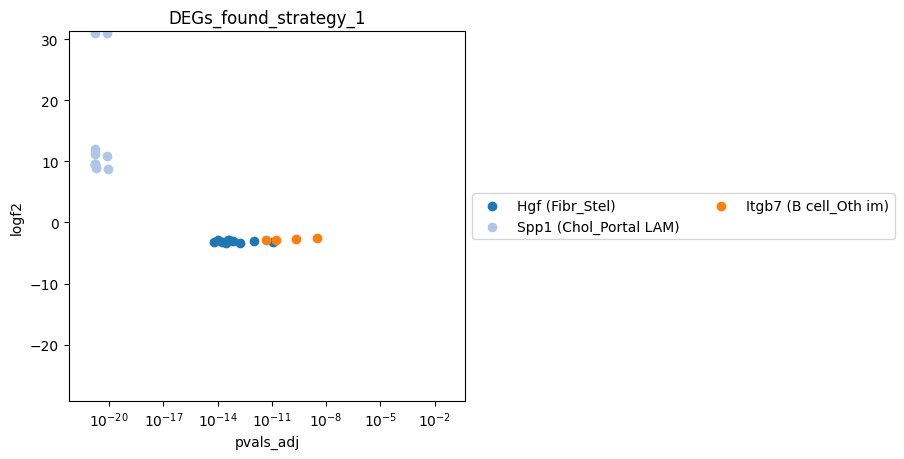

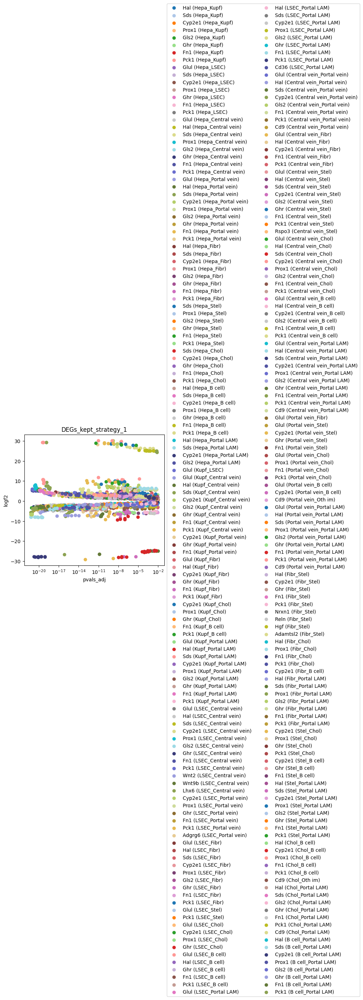

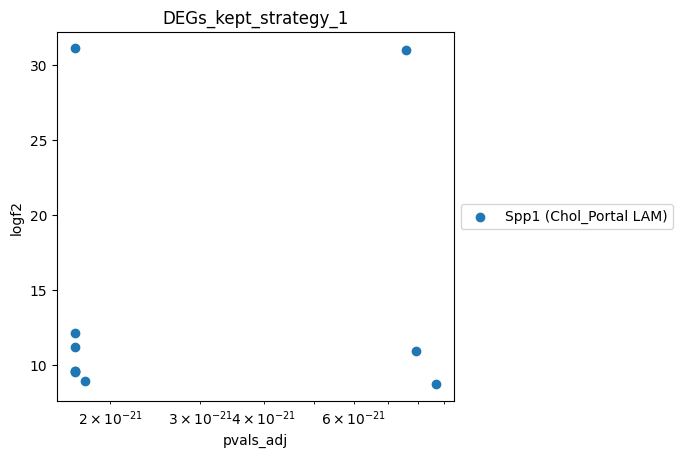

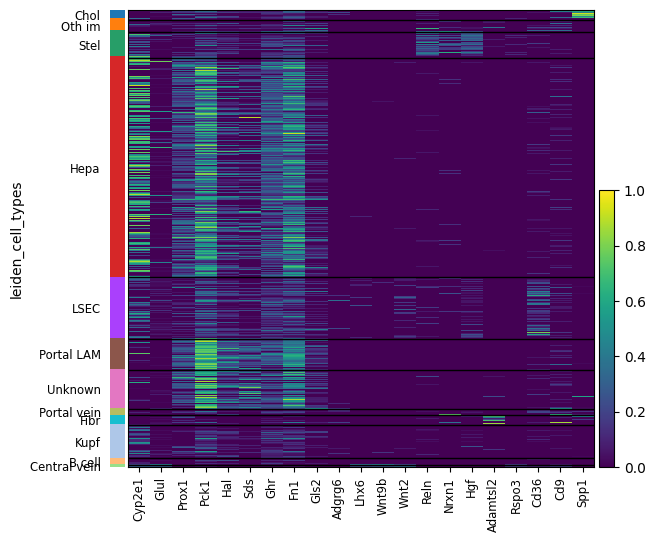

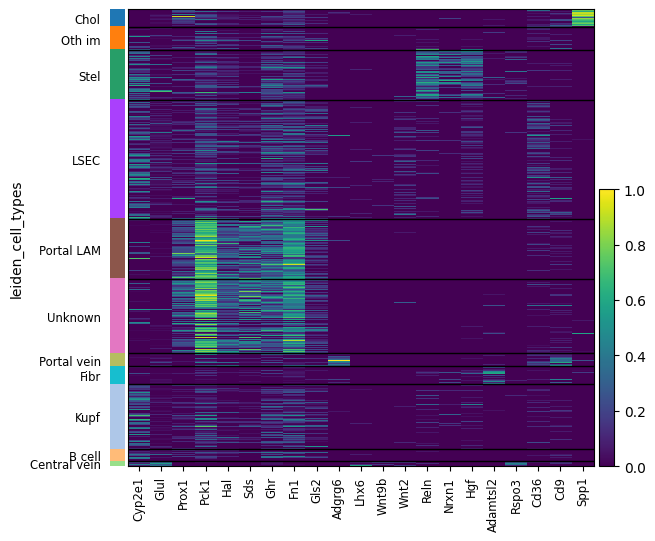

In [27]:
# STRATEGY 1 to change the marker gene list
results_strat1_10, results_runs1_10, DEG_details_runs1_10 = Apply_strategy_multiple_times(anndata,cell_types,leiden_clusters_per_ct,path_mg,10,1,OUTPUT_DIR)

67
Axl
Is marker gene of: ['Kupf']
Could also be a marker gene of: ['Fibr']
Ccr2
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Cd36
Is marker gene of: ['LSEC', 'Portal LAM']
Could also be a marker gene of: ['Portal vein']
Cd3e
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Dpt
Is marker gene of: ['Fibr']
Could also be a marker gene of: ['Chol']
Flt4
Is marker gene of: ['LSEC']
Could also be a marker gene of: ['Central vein']
Gdf15
Is marker gene of: []
Could also be a marker gene of: ['Portal LAM']
Igfbp3
Is marker gene of: ['Stel']
Could also be a marker gene of: ['Fibr']
Lpl
Is marker gene of: ['Kupf']
Could also be a marker gene of: ['Fibr']
Myh11
Is marker gene of: ['Stel']
Could also be a marker gene of: ['Portal vein']
Ngfr
Is marker gene of: ['Stel']
Could also be a marker gene of: ['LSEC', 'Central vein']
Plpp1
Is marker gene of: ['LSEC']
Could also be a marker gene of: ['Central vein']
Sirpa
Is marker gene of: ['LSEC', 'Kupf']
Could also be

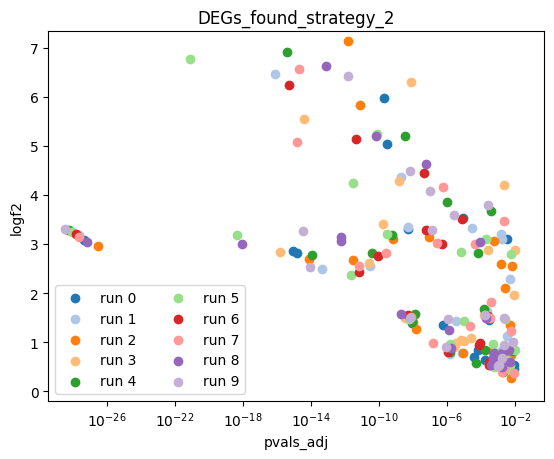

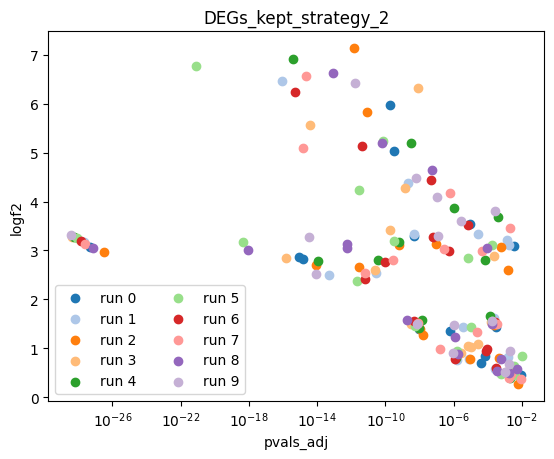

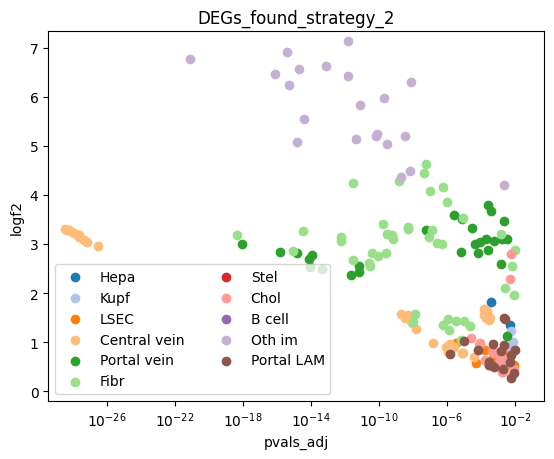

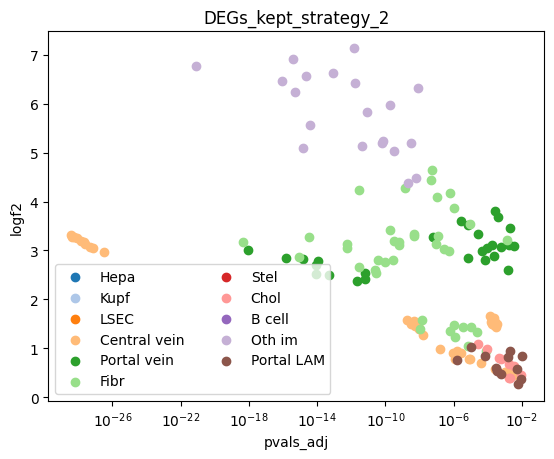

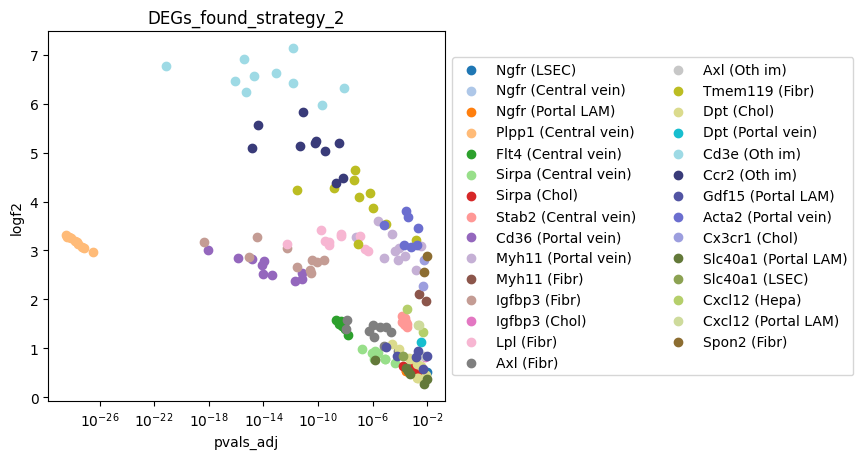

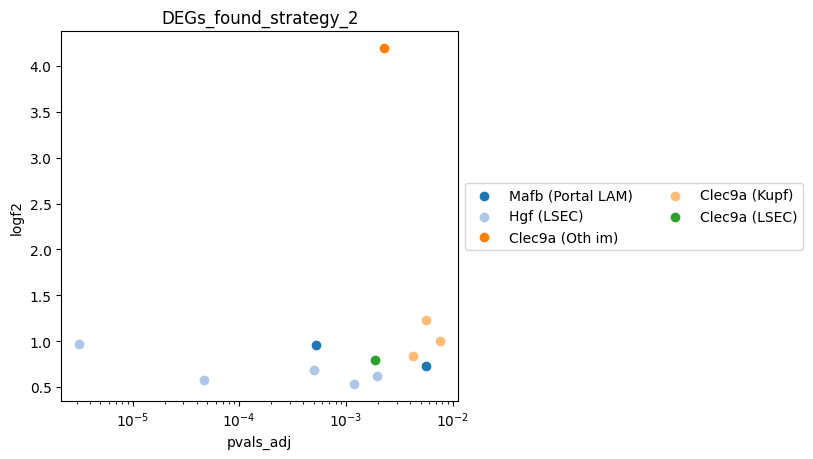

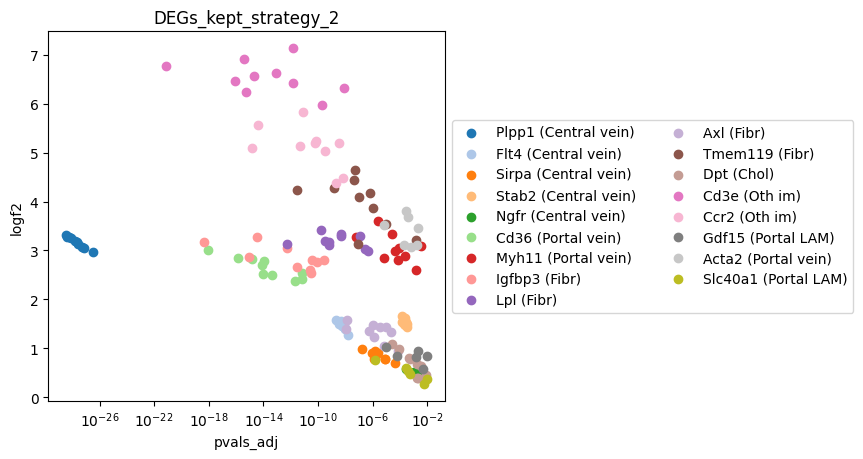

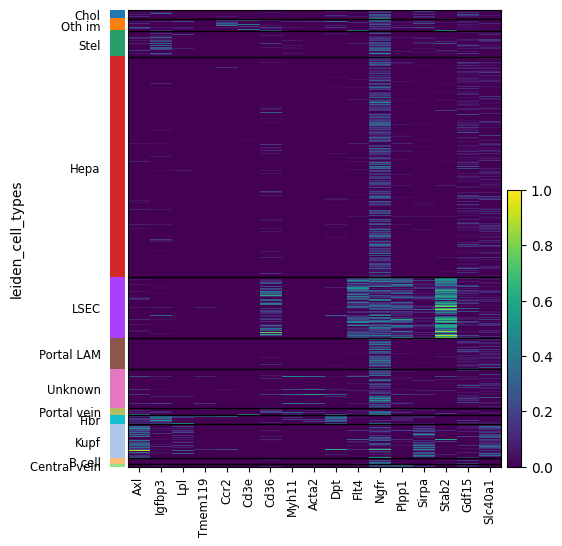

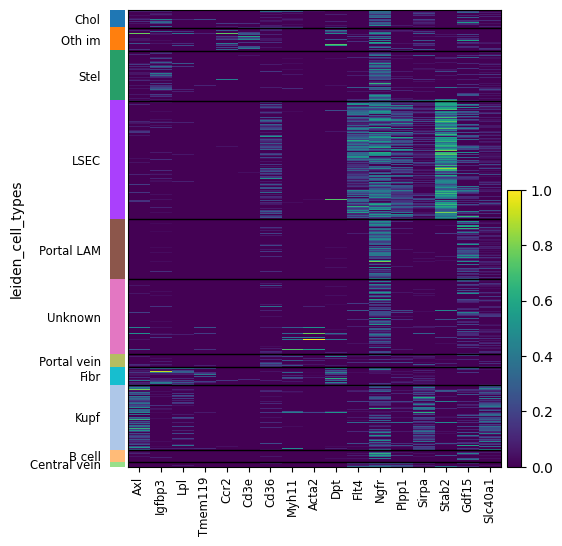

In [28]:
# STRATEGY 2 to change the marker gene list
results_strat2_10, results_runs2_10, DEG_details_runs2_10 = Apply_strategy_multiple_times(anndata,cell_types,leiden_clusters_per_ct,path_mg,10,2,OUTPUT_DIR)

In [29]:
# Update marker gene list based on STRATEGY 1 and STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
path_mg_mod_1_2 = OUTPUT_DIR + "/markerGeneListHL_othIm_endoSplit_portalLAM_modified_1_2.csv"
df_mg.to_csv(path_mg_mod_1_2)

Hepa             7.0
LSEC             7.0
Portal vein      8.0
Central vein    14.0
Chol             7.0
Kupf            16.0
Stel            14.0
Fibr            16.0
B cell           4.0
Meso            14.0
Portal LAM      12.0
Oth im           5.0
dtype: float64


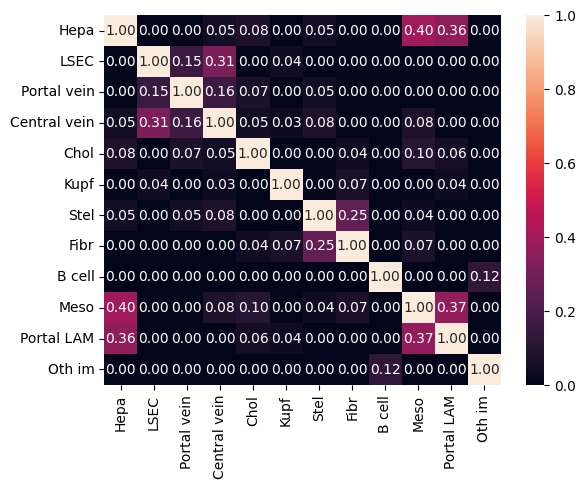

In [30]:
Jaccard_similarity_matrix(path_mg_mod_1_2)

Hepa            46.366227
Portal LAM      16.298539
LSEC            12.344140
Stel             6.118632
Kupf             5.156751
Meso             2.974706
Portal vein      2.315639
Chol             2.084076
Oth im           1.995012
Fibr             1.692198
B cell           1.505166
Central vein     1.050944
Unknown          0.097969
Name: annotation_own_score_genes_strat_1_2, dtype: float64


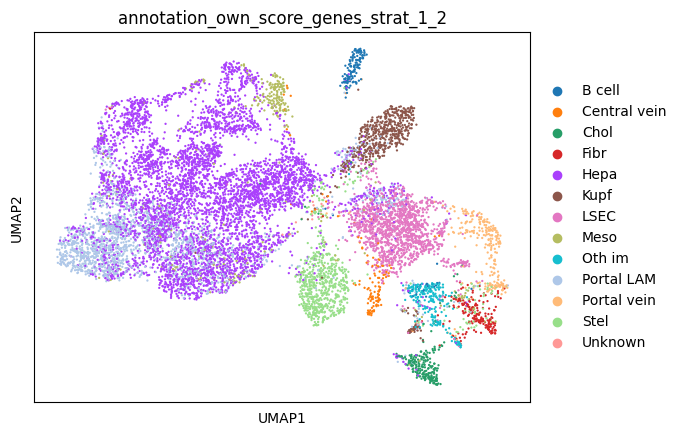

27.35126469540435


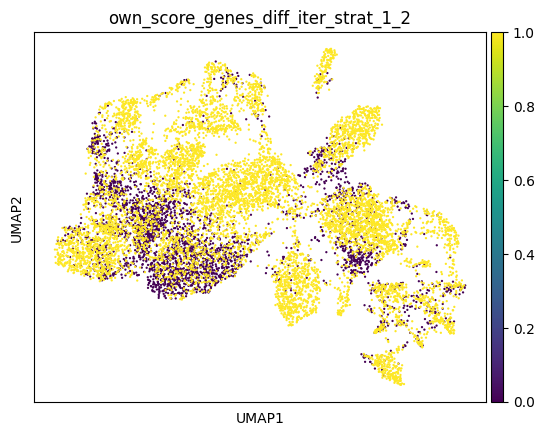

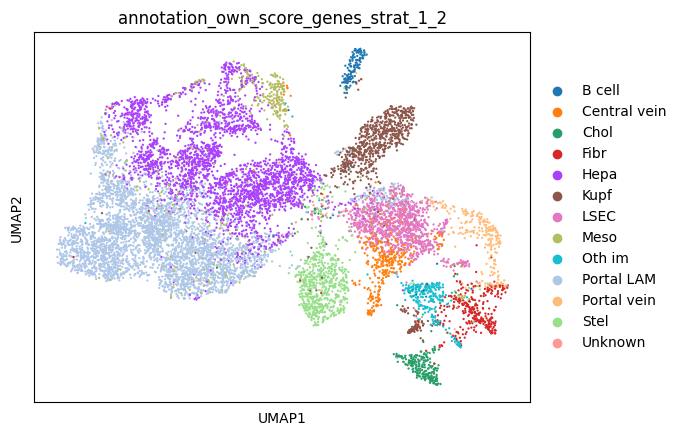

Portal LAM      33.817243
Hepa            25.543285
LSEC             9.814749
Kupf             6.929106
Stel             5.976131
Meso             3.464553
Central vein     3.259708
Fibr             2.814393
Portal vein      2.333452
Oth im           2.288921
Chol             2.262202
B cell           1.398290
Unknown          0.097969
Name: annotation_own_score_genes_strat_1_2, dtype: float64
2.8856430352689704


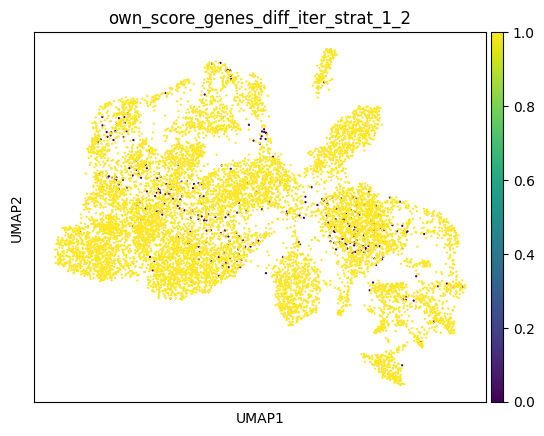

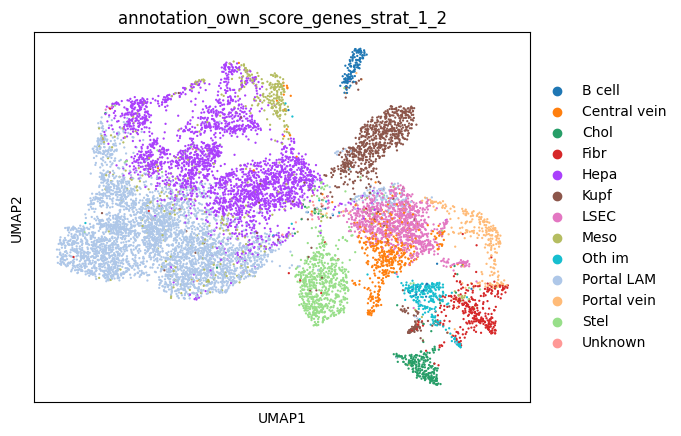

Portal LAM      34.547560
Hepa            23.984681
LSEC             8.933025
Kupf             7.089419
Stel             5.976131
Central vein     4.123620
Meso             4.061275
Fibr             2.965800
Portal vein      2.333452
Oth im           2.262202
Chol             2.244389
B cell           1.380477
Unknown          0.097969
Name: annotation_own_score_genes_strat_1_2, dtype: float64
0.6501603135019594


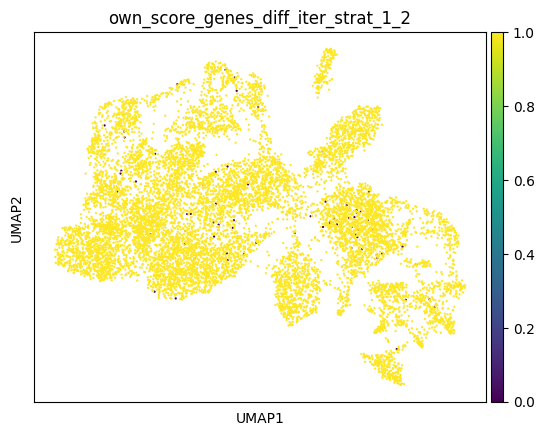

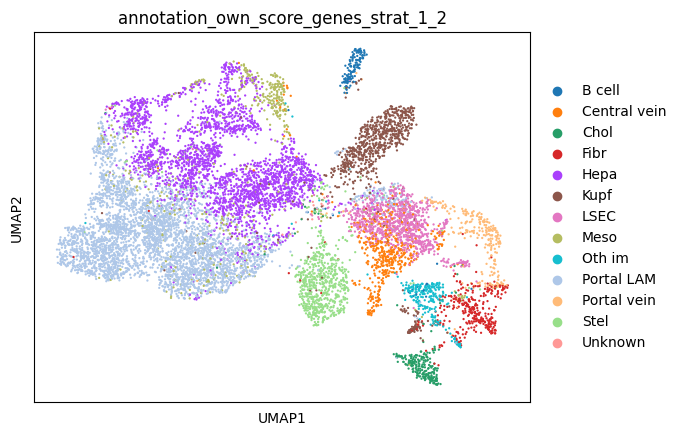

Portal LAM      34.369434
Hepa            23.797649
LSEC             8.719273
Kupf             7.133951
Stel             5.985037
Central vein     4.372996
Meso             4.310652
Fibr             2.992519
Portal vein      2.333452
Chol             2.253295
Oth im           2.253295
B cell           1.380477
Unknown          0.097969
Name: annotation_own_score_genes_strat_1_2, dtype: float64
0.26718916993231207


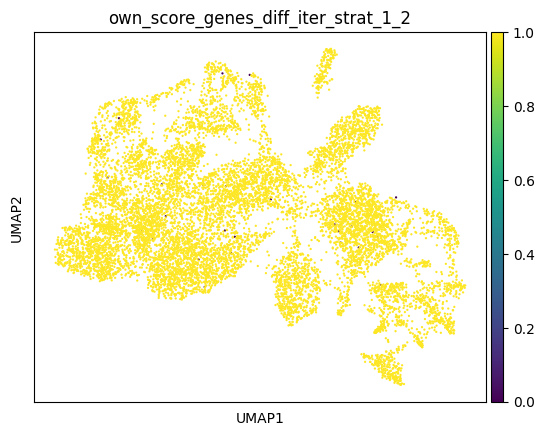

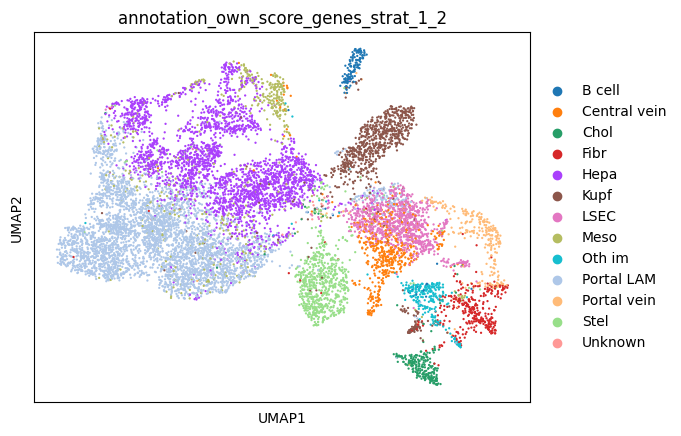

Portal LAM      34.226933
Hepa            23.788742
LSEC             8.648023
Kupf             7.142857
Stel             5.985037
Central vein     4.470965
Meso             4.417528
Fibr             2.992519
Portal vein      2.342358
Chol             2.253295
Oth im           2.253295
B cell           1.380477
Unknown          0.097969
Name: annotation_own_score_genes_strat_1_2, dtype: float64
0.10687566797292483


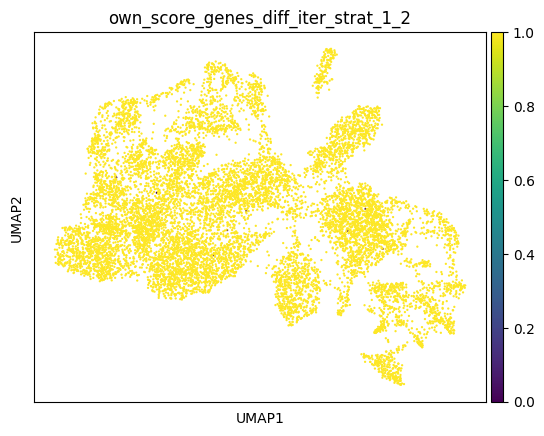

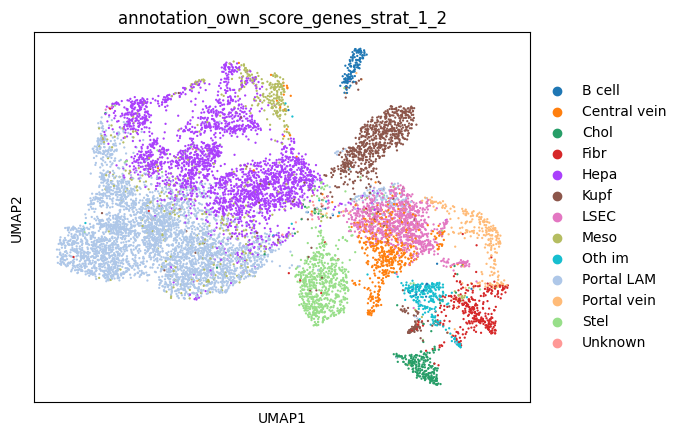

Portal LAM      34.173495
Hepa            23.806555
LSEC             8.603491
Kupf             7.142857
Stel             5.985037
Central vein     4.515497
Meso             4.444247
Fibr             2.992519
Portal vein      2.342358
Oth im           2.262202
Chol             2.253295
B cell           1.380477
Unknown          0.097969
Name: annotation_own_score_genes_strat_1_2, dtype: float64
0.035625222657641606
converged


,Hepa,LSEC,Portal vein,Central vein,Chol,Kupf,Stel,Fibr,B cell,Meso,Portal LAM,Oth im
0,7.803632,NaN,-2.749506,-5.031987,-1.485406,-2.907551,NaN,-5.434745,NaN,8.209378,9.416301,NaN
1,NaN,-1.191701,NaN,-3.896466,-2.039341,27.101020,NaN,14.945395,NaN,13.499528,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,-3.109242,NaN,10.632523,NaN,19.212327,NaN,NaN
3,1.123090,NaN,NaN,-4.773834,-1.162333,NaN,-4.457518,0.150109,NaN,6.277229,NaN,NaN
4,2.038718,NaN,NaN,-4.500815,-2.370830,NaN,-4.184499,NaN,NaN,0.252224,-0.880305,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
11223,1.758273,NaN,NaN,NaN,-2.596135,NaN,NaN,NaN,NaN,2.314171,3.510975,NaN
11224,6.904181,NaN,NaN,-3.347243,-2.495148,-0.375482,-3.030927,NaN,NaN,7.499233,7.906690,NaN
11225,1.632427,NaN,NaN,NaN,-1.750509,-0.527227,NaN,NaN,NaN,3.375543,3.085940,NaN
11226,NaN,NaN,NaN,NaN,NaN,0.586074,27.992704,7.666598,NaN,NaN,NaN,NaN


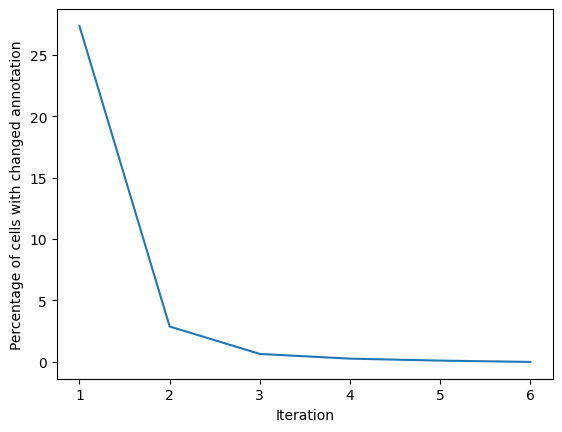

In [31]:
# Own score genes iterative with basic marker gene list updated with strategy 1 and 2
own_score_genes_iterative(anndata,path_mg_mod_1_2,nr_iterations=8,suffix='_strat_1_2',output_dir=OUTPUT_DIR)

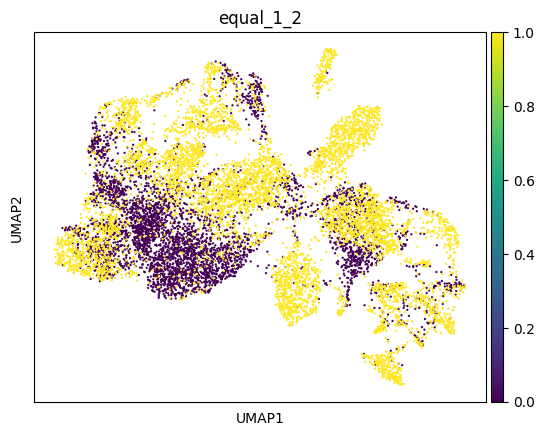

In [32]:
l = [anndata.obs['annotation_own_score_genes'].to_list()[i] == anndata.obs['annotation_own_score_genes_strat_1_2'].to_list()[i] for i in range(len(anndata.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
anndata.obs['equal_1_2'] = [int(i) for i in l]
sc.pl.umap(anndata,color=['equal_1_2'])

In [33]:
anndata.obs.columns

Index(['region', 'instance', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes',
       'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize',
       'score_celltype_own_score_genes',
       'second_score_celltype_own_score_genes', 'cleanliness_own_score_genes',
       'annotation_own_score_genes_start_iterative',
       'annotation_own_score_genes', 'count_density', 'leiden',
       'leiden_cell_types', 'score_celltype_own_score_genes_strat_1_2',
       'second_score_celltype_own_score_genes_strat_1_2',
       'cleanliness_own_score_genes_strat_1_2',
       'annotation_own_score_genes_start_iterative_strat_1_2',
       'annotation_own_score_genes_strat_1_2', 'equal_1_2'],
      dtype='object')

In [34]:
anndata.write_h5ad(OUTPUT_DIR+'/'+name_anndata+'_it_score_genes_Michiel.h5ad')